#Exploration Surface Water Dataset


##Mounting Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


##Getting the data (just the first time)

In [1]:
#%cd '/content/drive/MyDrive/Data/Earth_surface_water'
#!wget https://zenodo.org/record/5205674/files/dset-s2.zip
#!unzip dset-s2.zip

##Installing libraries

In [ ]:
!pip install rasterio
!pip install matplotlib==3.4.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 20.9 MB 1.2 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 10.3 MB 4.2 MB/s 
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2


##Importing libraries

All libraries imported successfully


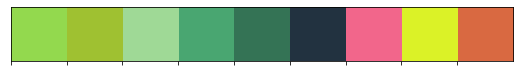

In [ ]:
#General libraries
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import random
import math
from pprint import pprint
from itertools import combinations
from itertools import combinations_with_replacement
import itertools
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from scipy.stats import kendalltau


#Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
plt.rcParams.update({'font.size': 14})
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

#Image processing libraries
import cv2
from PIL import Image
import tifffile as tiff
from osgeo import gdal

#Reading tif images libraries
import rasterio
from rasterio.plot import show


#Start and end
class infi:
    I = '\033[1m' + '\033[92m'
    F = '\033[91m'

#Colors for this notebook 
colors = ["#93D94E", "#9FC131", "#9FD996", "#49A671", "#347355", "#223240", "#F2668B", "#DBF227", "#D96941"]

cmap = ListedColormap(sns.color_palette(colors).as_hex())
print(infi.I + 'All libraries imported successfully' + infi.F)
sns.palplot(sns.color_palette(colors))
plt.show()

##Defining paths

In [2]:
#train_images_path = '/content/drive/MyDrive/Data/Earth_surface_water/dset-s2/tra_scene'
#train_masks_path = '/content/drive/MyDrive/Data/Earth_surface_water/dset-s2/tra_truth'
#val_images_path = '/content/drive/MyDrive/Data/Earth_surface_water/dset-s2/val_scene'
#val_masks_path = '/content/drive/MyDrive/Data/Earth_surface_water/dset-s2/val_truth'

##Create a dataframe with the data

In [ ]:
#get a list of all the images in the train folder   
train_images = os.listdir(train_images_path)
train_masks = os.listdir(train_masks_path)
example_name_file = 'S2A_L2A_20190125_N0211_R034_6Bands_S1.tif'
example_name_mask = 'S2A_L2A_20190125_N0211_R034_S1_Truth.tif'

#define a function to get the date and the cordenate of the image
def get_date_and_cordenate(name):
    date = name[8:16]
    cordenate = name[18:27]
    year, month, day = date[:4], date[4:6], date[6:]
    N, R = cordenate[:4], cordenate[6:]
    return year, month, day, N, R

#create a dataframe with the name of the images and the date and cordenate
train_df = pd.DataFrame(train_images, columns=['name'])
train_df['year'], train_df['month'], train_df['day'], train_df['N'], train_df['R'] = zip(*train_df['name'].apply(get_date_and_cordenate))
train_df['path'] = train_images_path + '/' + train_df['name']
train_df['mask_path'] = train_masks_path + '/' + train_df['name'].apply(lambda x: x[:-13]+ x[-6:-4] + '_Truth' +'.tif')
train_df.head() 

#get a list of all the images in the validation folder
val_images = os.listdir(val_images_path)
val_masks = os.listdir(val_masks_path)
example_name_file_val = 'S2A_L2A_20190318_N0211_R061_6Bands_S1.tif'
example_name_mask_val = 'S2A_L2A_20190318_N0211_R061_S1_Truth.tif'

#create a dataframe with the name of the images and the date and cordenate for the validation set
val_df = pd.DataFrame(val_images, columns=['name'])
val_df['year'], val_df['month'], val_df['day'], val_df['N'], val_df['R'] = zip(*val_df['name'].apply(get_date_and_cordenate))
val_df['path'] = val_images_path + '/' + val_df['name']
val_df['mask_path'] = val_masks_path + '/' + val_df['name'].apply(lambda x: x[:-13] + x[-6:-4]+ '_Truth.tif')
val_df.head() 

#sort both dataframes by date
train_df = train_df.sort_values(by=['year', 'month', 'day'])
val_df = val_df.sort_values(by=['year', 'month', 'day'])

train_df.describe()

,name,year,month,day,N,R,path,mask_path
count,64,64,64,64,64,64,64,64
unique,64,2,11,16,3,19,64,64
top,S2B_L2A_20181226_N0211_R102_6Bands_S2.tif,2019,08,25,0213,102,/content/drive/MyDrive/Islamabad Omdena/Data/E...,/content/drive/MyDrive/Islamabad Omdena/Data/E...
freq,1,61,25,6,37,6,1,1


##Lets plot some data

Train images plots by date


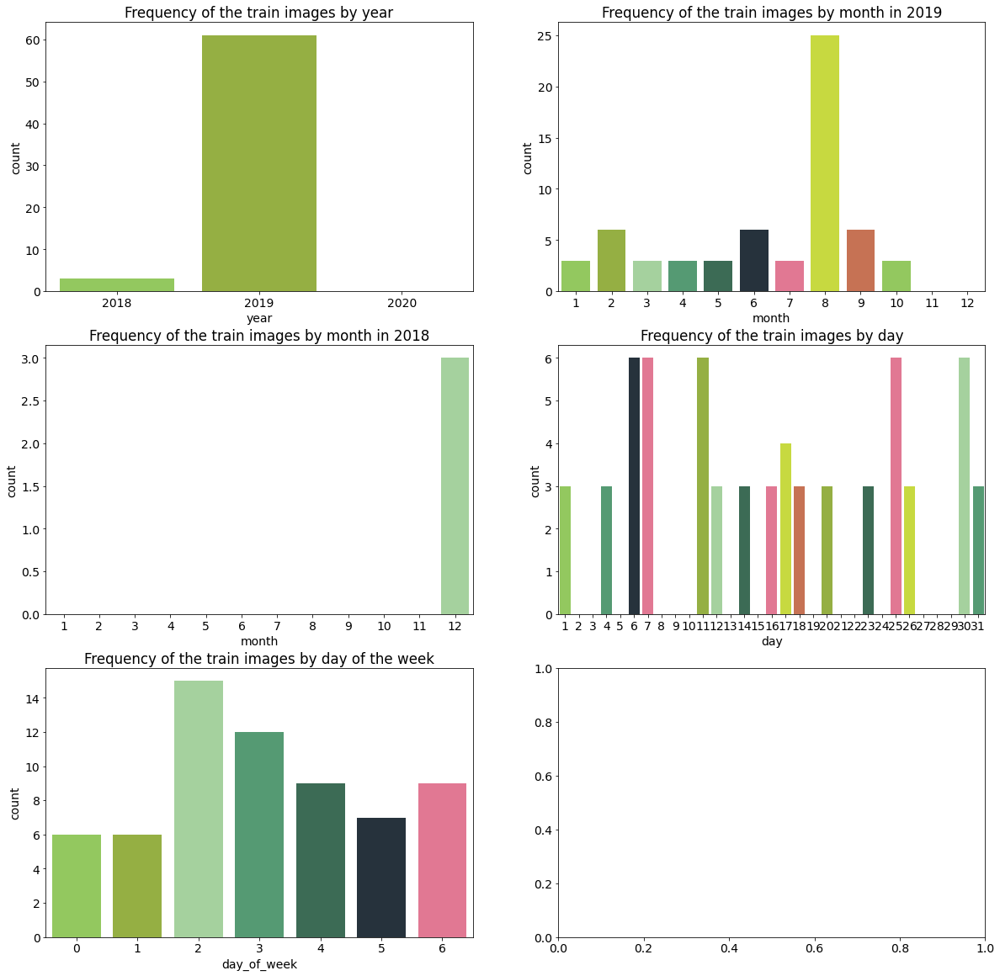

In [ ]:
print(infi.I + "Train images plots by date" + infi.F)
#create a grid of 3x2 plots
fig, ax = plt.subplots(3, 2, figsize=(20, 20))

#plot the frequency of the train images by year
train_df_year = pd.DataFrame(columns=['year', 'count'])
for i in range(2018, 2021):
    count = train_df[train_df['year'] == str(i)].shape[0]
    train_df_year = train_df_year.append({'year': i, 'count': count}, ignore_index=True)
sns.barplot(x='year', y='count', data=train_df_year, palette=colors, ax=ax[0, 0])
ax[0, 0].set_title('Frequency of the train images by year')

#plot the frecuency of the train images by month in 2019
train_df_2019 = pd.DataFrame(columns=['month', 'count'])
for i in range(1, 13):
    count = train_df[(train_df['year'] == '2019') & (train_df['month'] == str(i).zfill(2))].shape[0]
    train_df_2019 = train_df_2019.append({'month': i, 'count': count}, ignore_index=True)
sns.barplot(x='month', y='count', data=train_df_2019, palette=colors, ax=ax[0, 1])
ax[0, 1].set_title('Frequency of the train images by month in 2019')


#plot the frecuency of the train images by month in 2018
train_df_2018 = pd.DataFrame(columns=['month', 'count'])
for i in range(1, 13):
    count = train_df[(train_df['year'] == '2018') & (train_df['month'] == str(i).zfill(2))].shape[0]
    train_df_2018 = train_df_2018.append({'month': i, 'count': count}, ignore_index=True)
sns.barplot(x='month', y='count', data=train_df_2018, palette=colors, ax=ax[1, 0])
ax[1, 0].set_title('Frequency of the train images by month in 2018')

#plot the frecuency of the train images by day
train_df_day = pd.DataFrame(columns=['day', 'count'])
for i in range(1, 32):
    count = train_df[(train_df['day'] == str(i).zfill(2))].shape[0]
    train_df_day = train_df_day.append({'day': i, 'count': count}, ignore_index=True)
sns.barplot(x='day', y='count', data=train_df_day, palette=colors, ax=ax[1, 1])
ax[1, 1].set_title('Frequency of the train images by day')

#plot the images by day of the week
train_df['day_of_week'] = train_df['year'] + '-' + train_df['month'] + '-' + train_df['day']
train_df['day_of_week'] = pd.to_datetime(train_df['day_of_week'])
train_df['day_of_week'] = train_df['day_of_week'].dt.dayofweek
train_df_day_of_week = pd.DataFrame(columns=['day_of_week', 'count'])
for i in range(0, 7):
    count = train_df[(train_df['day_of_week'] == i)].shape[0]
    train_df_day_of_week = train_df_day_of_week.append({'day_of_week': i, 'count': count}, ignore_index=True)
sns.barplot(x='day_of_week', y='count', data=train_df_day_of_week, palette=colors, ax=ax[2, 0])
ax[2, 0].set_title('Frequency of the train images by day of the week')
plt.show()



Validation images plots by date


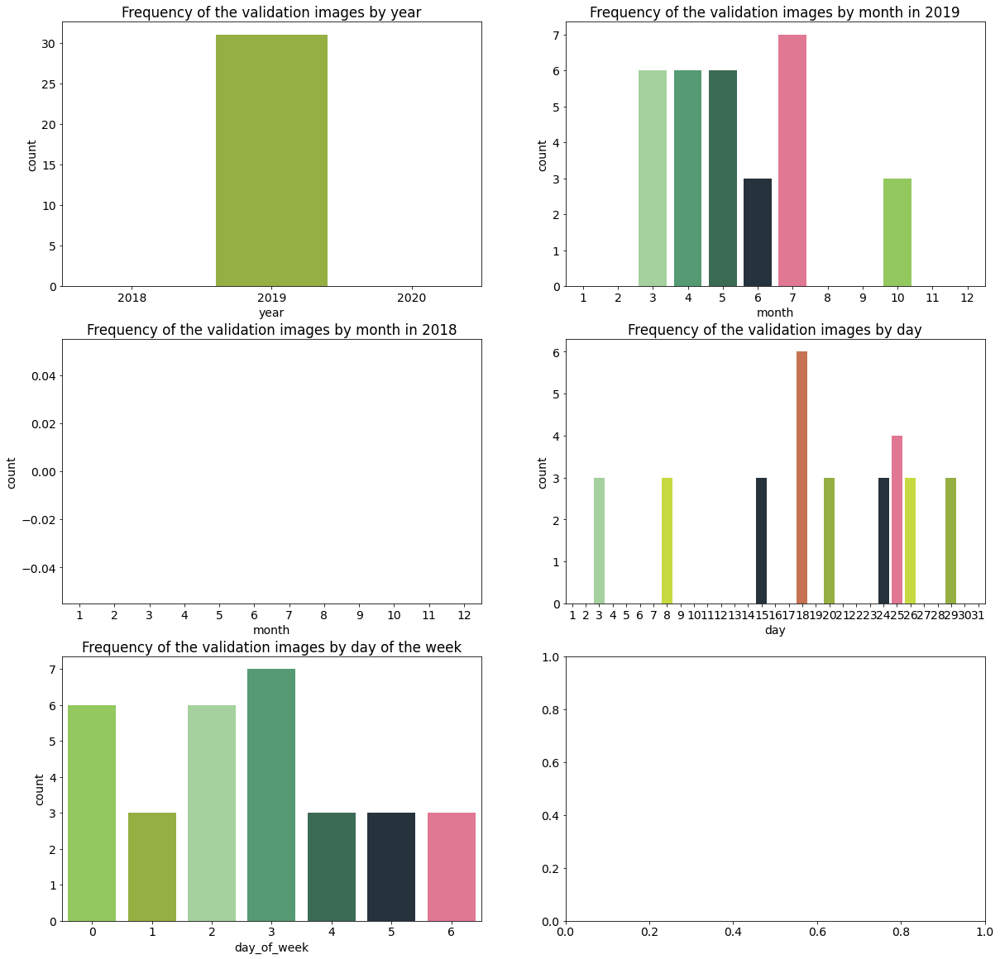

In [ ]:
#the same plots for the validation set
print(infi.I + "Validation images plots by date" + infi.F)
fig, ax = plt.subplots(3, 2, figsize=(20, 20))
val_df_year = pd.DataFrame(columns=['year', 'count'])
for i in range(2018, 2021):
    count = val_df[val_df['year'] == str(i)].shape[0]
    val_df_year = val_df_year.append({'year': i, 'count': count}, ignore_index=True)
sns.barplot(x='year', y='count', data=val_df_year, palette=colors, ax=ax[0, 0])
ax[0, 0].set_title('Frequency of the validation images by year')

val_df_2019 = pd.DataFrame(columns=['month', 'count'])
for i in range(1, 13):
    count = val_df[(val_df['year'] == '2019') & (val_df['month'] == str(i).zfill(2))].shape[0]
    val_df_2019 = val_df_2019.append({'month': i, 'count': count}, ignore_index=True)
sns.barplot(x='month', y='count', data=val_df_2019, palette=colors, ax=ax[0, 1])
ax[0, 1].set_title('Frequency of the validation images by month in 2019')

val_df_2018 = pd.DataFrame(columns=['month', 'count'])
for i in range(1, 13):
    count = val_df[(val_df['year'] == '2018') & (val_df['month'] == str(i).zfill(2))].shape[0]
    val_df_2018 = val_df_2018.append({'month': i, 'count': count}, ignore_index=True)
sns.barplot(x='month', y='count', data=val_df_2018, palette=colors, ax=ax[1, 0])
ax[1, 0].set_title('Frequency of the validation images by month in 2018')

val_df_day = pd.DataFrame(columns=['day', 'count'])
for i in range(1, 32):
    count = val_df[(val_df['day'] == str(i).zfill(2))].shape[0]
    val_df_day = val_df_day.append({'day': i, 'count': count}, ignore_index=True)
sns.barplot(x='day', y='count', data=val_df_day, palette=colors, ax=ax[1, 1])
ax[1, 1].set_title('Frequency of the validation images by day')

val_df['day_of_week'] = val_df['year'] + '-' + val_df['month'] + '-' + val_df['day']
val_df['day_of_week'] = pd.to_datetime(val_df['day_of_week'])
val_df['day_of_week'] = val_df['day_of_week'].dt.dayofweek
val_df_day_of_week = pd.DataFrame(columns=['day_of_week', 'count'])
for i in range(0, 7):
    count = val_df[(val_df['day_of_week'] == i)].shape[0]
    val_df_day_of_week = val_df_day_of_week.append({'day_of_week': i, 'count': count}, ignore_index=True)
sns.barplot(x='day_of_week', y='count', data=val_df_day_of_week, palette=colors, ax=ax[2, 0])
ax[2, 0].set_title('Frequency of the validation images by day of the week')
plt.show()

##Some insights from the data
1. The train data is from 2018 and 2019.
2. The training and validation images were taken between december 2018 and october 2019.
3. The validation data is just from 2019.
4. Most of the 90% of images in the training set are from 2019.
5. Most of the images in the training set were taken in august meanwhile in the validation set the images are distrubuted more evenly, it could generate some kind of data drift.
6. There is no irregular distribution of the images by day of the week.

##Let's visualize the images

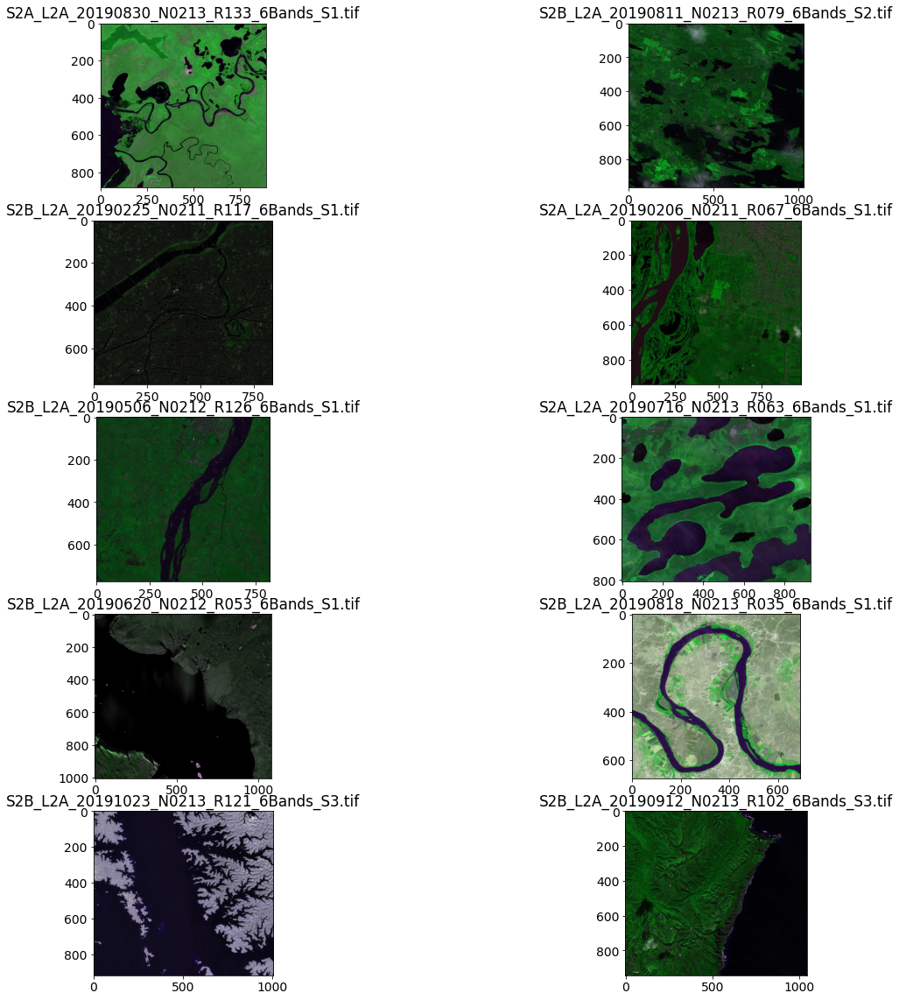

In [ ]:
#function to plot the tif images

#create a function to find the max value for each band of all the images on the train set
def get_max_values(df):
    max_values = []
    for i in range(0, 6):
        max_values.append(0)
    for i, row in df.iterrows():
        ds = gdal.Open(row['path'])
        if ds is None:
          print("Could not open image")
          return
        # Read the image as a NumPy array
        img = ds.ReadAsArray()
        for i in range(0, 6):
            max_values[i] = max(max_values[i], np.amax(img[i]))
    return max_values
#the result values are so high about 18000
max_values_train = get_max_values(train_df)

def plot_random_images(df, n_images=10, number_of_columns=2, bands_to_plot = [0,1,2]):
    fig, ax = plt.subplots(n_images // number_of_columns, number_of_columns, figsize=(20, 20))
    random_images = df.sample(n_images).reset_index()
    for i, row in random_images.iterrows():
        ds = gdal.Open(row['path'])
        if ds is None:
          print("Could not open image")
          return
        # Read the image as a NumPy array
        img = ds.ReadAsArray()

        # Select the bands to use as red, green, and blue channels
        red = img[bands_to_plot[0]]
        green = img[bands_to_plot[1]]
        blue = img[bands_to_plot[2]]


        """red = red / max_values_train[bands_to_plot[0]]
        green = green / max_values_train[bands_to_plot[1]]
        blue = blue / max_values_train[bands_to_plot[2]]"""
        #The highest values of the data are about 18000 and the image gets too dark :(, so we are using the local max values for each band
        red = red / np.amax(red)
        green = green / np.amax(green)
        blue = blue / np.amax(blue)

        # Combine the selected bands into an RGB image
        rgb = np.dstack((red, green, blue))
        ax[math.ceil(i/number_of_columns - 1), number_of_columns - i % number_of_columns - 1].imshow(rgb)
        ax[math.ceil(i/number_of_columns - 1), number_of_columns - i % number_of_columns - 1].set_title(row['name'])

    plt.show()

#create a function to plot images from a list of paths
def plot_images_from_list(list_of_paths, number_of_columns=2, bands_to_plot = [0,1,2]):
    n_images = len(list_of_paths)
    fig, ax = plt.subplots(n_images // number_of_columns, number_of_columns, figsize=(20, 20))
    for i, path in enumerate(list_of_paths):
        ds = gdal.Open(path)
        if ds is None:
          print("Could not open image")
          return
        # Read the image as a NumPy array
        img = ds.ReadAsArray()

        # Select the bands to use as red, green, and blue channels
        red = img[bands_to_plot[0]]
        green = img[bands_to_plot[1]]
        blue = img[bands_to_plot[2]]

        red = red / np.amax(red)
        green = green / np.amax(green)
        blue = blue / np.amax(blue)
        
        # Combine the selected bands into an RGB image
        rgb = np.dstack((red, green, blue))
        ax[math.ceil(i/number_of_columns - 1), number_of_columns - i % number_of_columns - 1].imshow(rgb)

    plt.show()

#plot just one image from path
def plot_image_from_path(path, bands_to_plot = [0,1,2], image_name='image', ax = None):
    ds = gdal.Open(path)
    if ds is None:
      print("Could not open image")
      return
    # Read the image as a NumPy array
    img = ds.ReadAsArray()

    # Select the bands to use as red, green, and blue channels
    red = img[bands_to_plot[0]]
    green = img[bands_to_plot[1]]
    blue = img[bands_to_plot[2]]

    red = red / np.amax(red)
    green = green / np.amax(green)
    blue = blue / np.amax(blue)
    
    # Combine the selected bands into an RGB image
    rgb = np.dstack((red, green, blue))

    if ax is None:
        plt.imshow(rgb)
        plt.title(image_name)
        plt.show()
    else:
        ax.imshow(rgb)
        ax.set_title(image_name)
        ax.axis('off')

plot_random_images(train_df, n_images=10, number_of_columns=2, bands_to_plot=[2,3,1])


##6 bands vs 3 bands
To visualize the image on RGB we need to pick the 3 bands that are more representative of the image. We can do this by looking at the histogram of the bands. The histogram shows the distribution of the values of the bands. The bands with the highest values are the ones that are more representative of the image. Another alternative is just try all the possible combinations and pick the one that looks better, haha.

/usr/local/lib/python3.8/dist-packages/matplotlib/text.py:1215: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


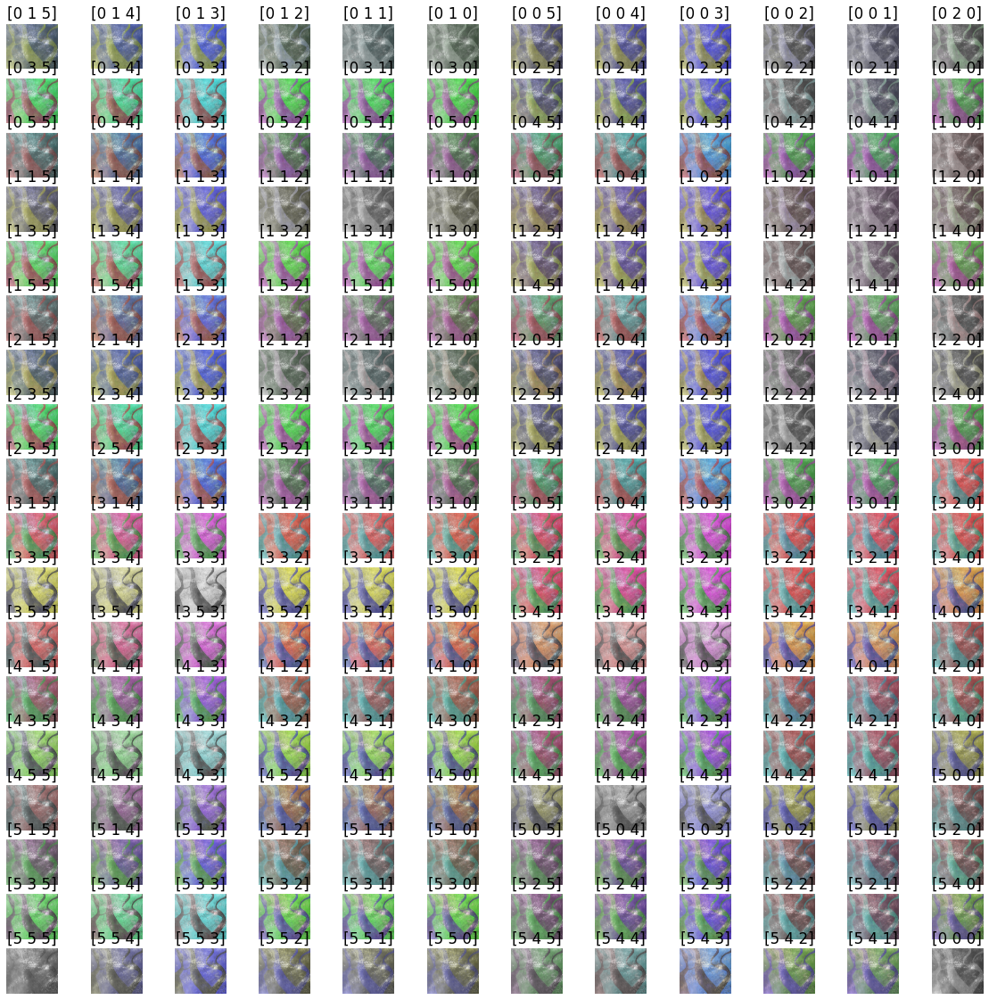

In [ ]:
#function to plot the all the combinations of the bands from a path without repeating the same band for two channels

def plot_all_band_combinations(path, number_of_columns=12):
    all_combinations = np.array(list(itertools.product([0,1,2,3,4,5], repeat = 3)))
    fig, ax = plt.subplots(math.ceil(len(all_combinations)/number_of_columns), number_of_columns, figsize=(20, 20))
    for i in range(0, len(all_combinations)):
        plot_image_from_path(path, bands_to_plot=all_combinations[i], image_name=all_combinations[i], ax=ax[math.ceil(i/number_of_columns - 1), number_of_columns - i % number_of_columns - 1])



plot_all_band_combinations(train_df['path'].tolist()[0])

Ok, that wasn't a great idea. There are a lot of images to compare lol. Let's try to find a better way.
I'm going to use some kind of statistichal technique to onalize the correlation between the values of each band and the water mask, where are going to do it later. Meanwhile let's visualize all the bands of each image.

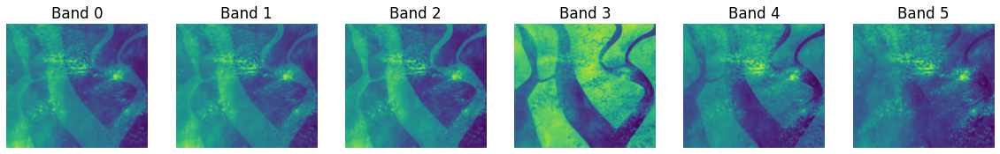

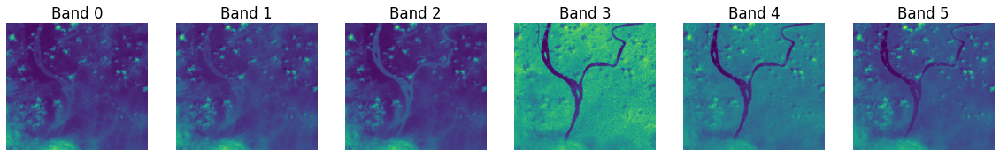

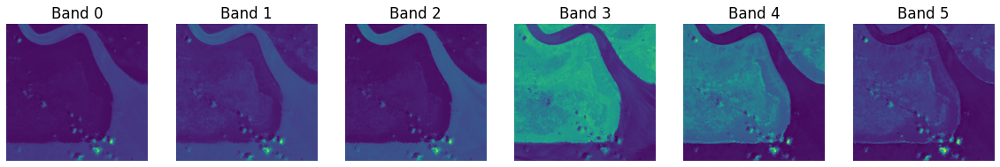

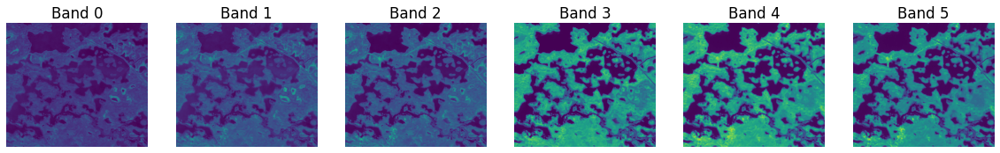

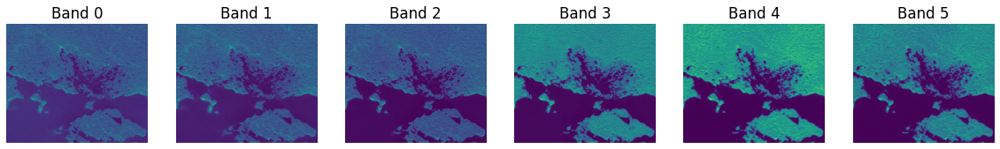

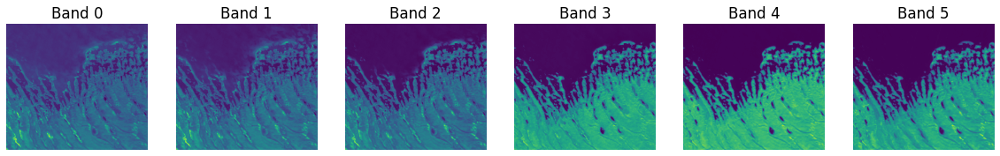

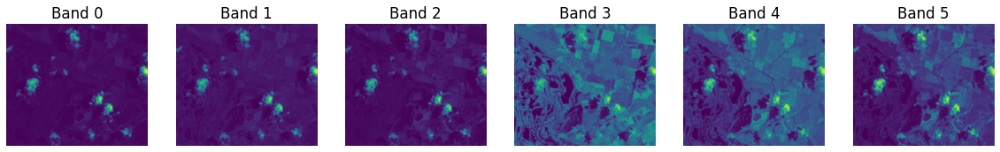

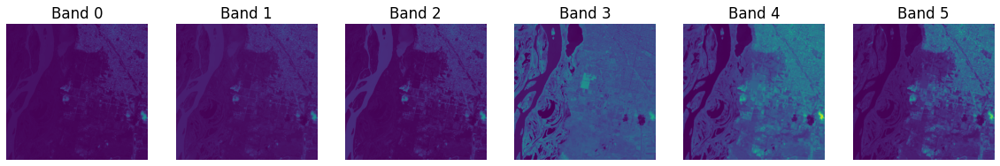

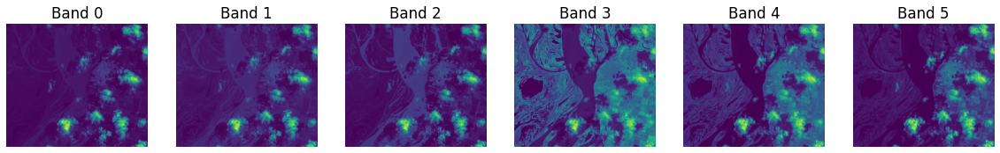

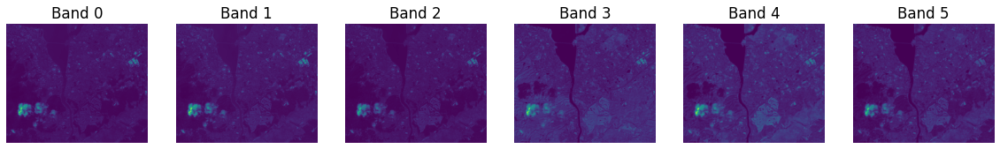

In [ ]:

def plot_all_bands_in_different_images(path):
    ds = gdal.Open(path)
    if ds is None:
      print("Could not open image")
      return
    # Read the image as a NumPy array
    img = ds.ReadAsArray()
    #get the axs
    fig, ax = plt.subplots(1, img.shape[0], figsize=(20, 5))
    for i in range(0, 6):
        ax[i].imshow(img[i])
        ax[i].set_title('Band ' + str(i))
        ax[i].axis('off')

def plot_just_one_band(path, band_number, image_name='image', ax = None):
    ds = gdal.Open(path)
    if ds is None:
      print("Could not open image")
      return
    # Read the image as a NumPy array
    img = ds.ReadAsArray()

    # Select the bands to use as red, green, and blue channels
    band = img[band_number]

    band = band / np.amax(band)
    if ax is None:
        plt.imshow(band)
        plt.title(image_name)
        plt.show()
    else:
        ax.imshow(band)
        ax.set_title(image_name)
        ax.axis('off')
n_images = 10
for i in range(0, n_images):
    plot_all_bands_in_different_images(train_df['path'].tolist()[i])

##Visualizing the mask of the dataset

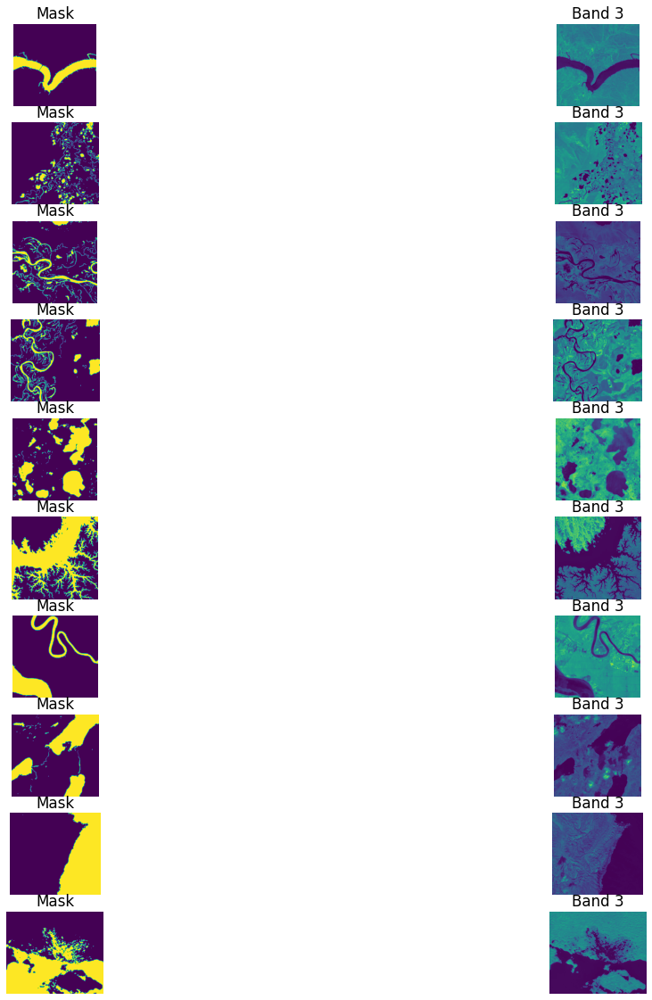

In [ ]:
#define a function plot a mask from a path on a specific ax
def plot_mask_from_path(path, image_name='image', ax = None):
    ds = gdal.Open(path)
    if ds is None:
      print("Could not open image")
      return
    # Read the image as a NumPy array
    img = ds.ReadAsArray()
    #plot the mask
    if ax is None:
        plt.imshow(img)
        plt.title(image_name)
        plt.show()
    else:
        ax.imshow(img)
        ax.set_title(image_name)
        ax.axis('off')
    

#define a function to visualize the masks of the images next to from a index of the dataset
def plot_masks(dataframe, n_images=10, bands = [0,1]):
    fig, ax = plt.subplots(n_images, len(bands) + 1, figsize=(20, 20))
    sample = dataframe.sample(n_images).reset_index()
    for i, row in sample.iterrows():
        #plot the mask
        plot_mask_from_path(row['mask_path'], image_name='Mask', ax=ax[i, 0])
        #plot the images for each band
        for j, band in enumerate(bands):
            plot_just_one_band(row['path'], band, image_name='Band ' + str(band), ax=ax[i, j + 1])  
plot_masks(train_df, n_images=10, bands=[3])
    

##Let's do some statistical image analysis.

First we compute the NDWI, the MNDWI and the NDVI of each image. Then we compute the correlation between the values of each band and the water mask.





1. $\text{NDWI} = \frac{\text{Green} - \text{NIR}}{\text{Green} + \text{NIR}}$
2. $\text{MNDWI} = \frac{\text{Green} - \text{SWIR}}{\text{Green} + \text{SWIR}}$
3. $\text{NDVI} = \frac{\text{NIR} - \text{Red}}{\text{NIR} + \text{Red}}$

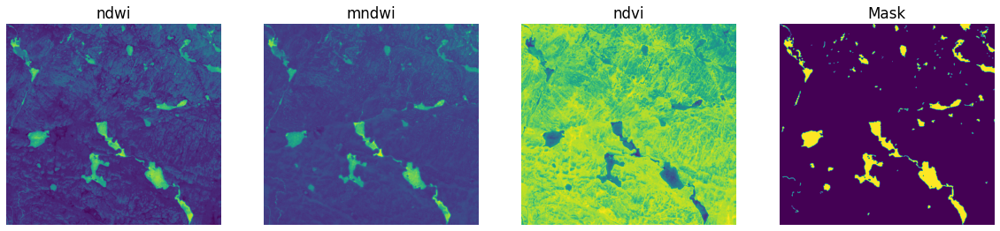

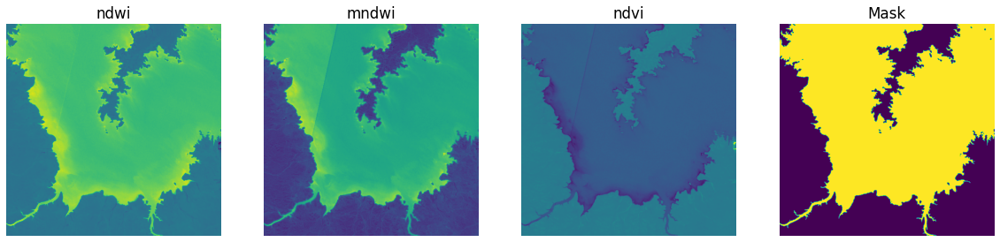

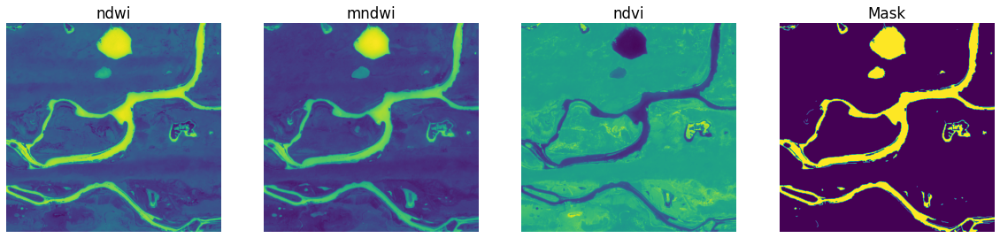

<ipython-input-13-ae95594bf873>:17: RuntimeWarning: invalid value encountered in true_divide
  ndwi_im = (green - nir) / (green + nir)
<ipython-input-13-ae95594bf873>:20: RuntimeWarning: invalid value encountered in true_divide
  mndwi_im = (green - swir1) / (green + swir1)
<ipython-input-13-ae95594bf873>:23: RuntimeWarning: invalid value encountered in true_divide
  ndvi_im = (nir - red) / (nir + red)


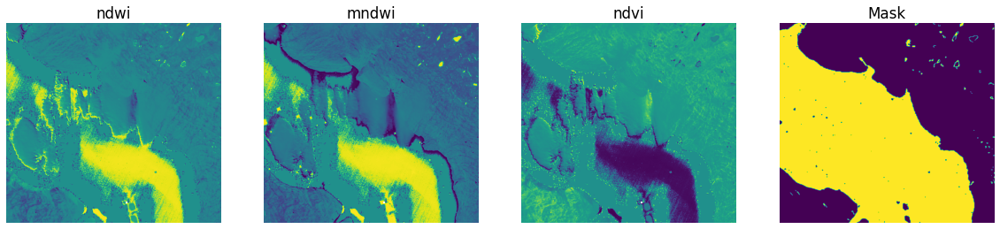

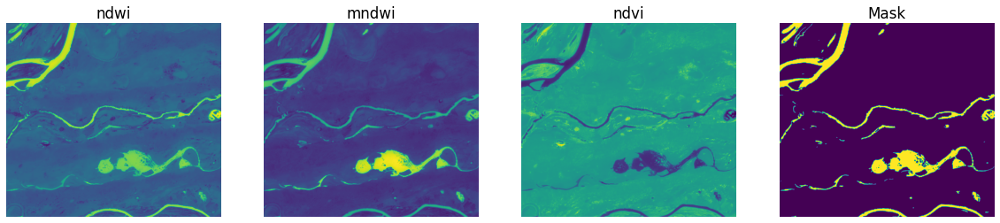

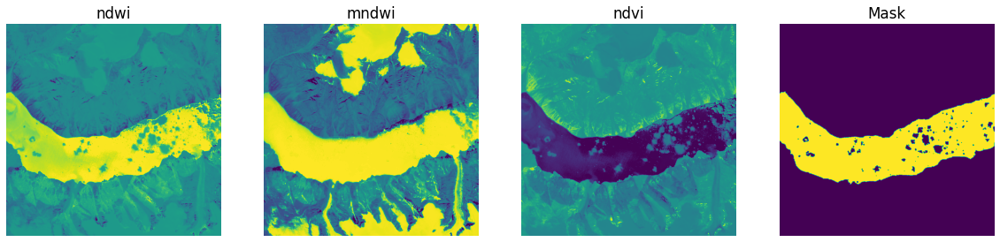

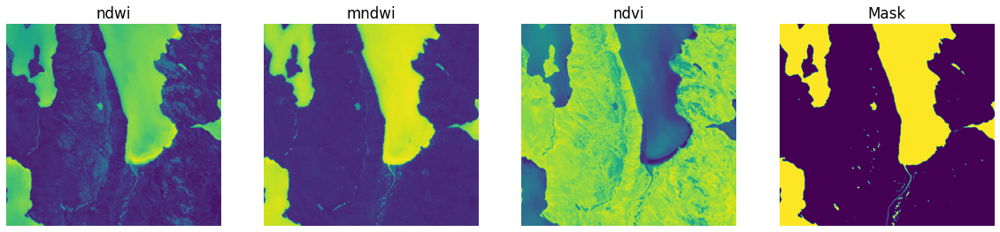

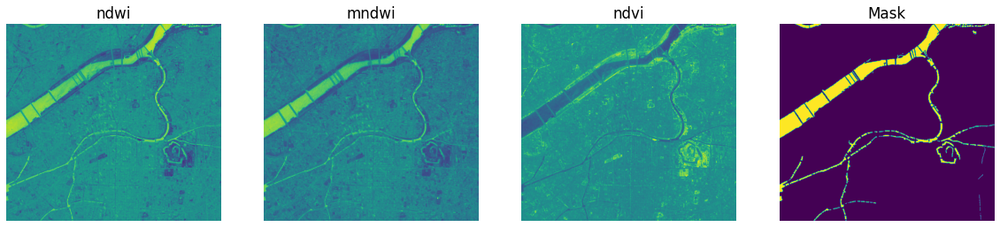

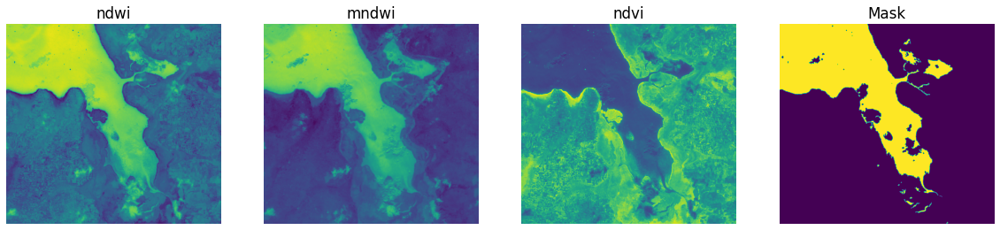

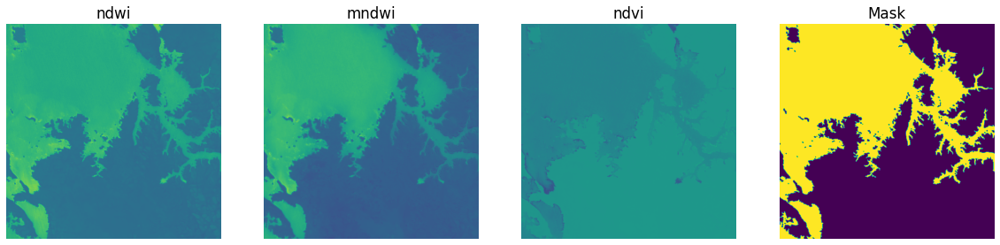

In [ ]:
def get_stats(path, ndwi = True, mndwi = True, ndvi = True):
    ds = gdal.Open(path)
    if ds is None:
      print("Could not open image")
      return
    # Read the image as a NumPy array
    blue = ds.GetRasterBand(1).ReadAsArray().astype(np.int16)
    green = ds.GetRasterBand(2).ReadAsArray().astype(np.int16)
    red = ds.GetRasterBand(3).ReadAsArray().astype(np.int16)
    nir = ds.GetRasterBand(4).ReadAsArray().astype(np.int16)
    swir1 = ds.GetRasterBand(5).ReadAsArray().astype(np.int16)
    swir2 = ds.GetRasterBand(6).ReadAsArray().astype(np.int16)

    stat_im = {}

    if (ndwi):
        ndwi_im = (green - nir) / (green + nir)
        stat_im['ndwi'] = ndwi_im
    if (mndwi):
        mndwi_im = (green - swir1) / (green + swir1)
        stat_im['mndwi'] = mndwi_im
    if (ndvi):
        ndvi_im = (nir - red) / (nir + red)
        stat_im['ndvi'] = ndvi_im

    return stat_im

def plot_statistical_analysis(path, image_name='image', ax = None, ndwi = True, mndwi = True, ndvi = True, mask_path = False):
    
    stat_im = get_stats(path, ndwi = ndwi, mndwi = mndwi, ndvi = ndvi)

    #plot the images
    if ax is None:
        fig, ax = plt.subplots(1, ndwi + mndwi + ndvi + bool(mask_path), figsize=(20, 5))
        for i, (key, value) in enumerate(stat_im.items()):
            ax[i].imshow(value)
            ax[i].set_title(key)
            ax[i].axis('off')
        if mask_path:
            plot_mask_from_path(mask_path, image_name='Mask', ax=ax[-1])
        plt.show()
    else:
        if ndwi + mndwi + ndvi > 1:
            print('Too many images to plot')
            return
        for i, (key, value) in enumerate(stat_im.items()):
            ax.imshow(value)
            ax.set_title(key)
            ax.axis('off')
sample_df = train_df.sample(10).reset_index()
for i, row in sample_df.iterrows():
    plot_statistical_analysis(row['path'], mask_path=row['mask_path'], ndwi=True, mndwi=True, ndvi=True)



Really cool, isn't it?

##Correlation
Now let's create a function to compute the correlation between the mask and the ndwi, mndwi and ndvi, or even each band of the image

In [ ]:
def compute_person_correlation(path, mask_path):
    stat_im = get_stats(path, ndwi = True, mndwi = True, ndvi = True)
    mask = gdal.Open(mask_path ).ReadAsArray()
    
    corr = {}
    for key, value in stat_im.items():
        corr[key] = np.corrcoef(value.flatten(), mask.flatten())[0,1]
    
    #get bands of the image in path
    ds = gdal.Open(path)
    if ds is None:
        print("Could not open image")
        return
    # Read the image as a NumPy array
    blue = ds.GetRasterBand(1).ReadAsArray()
    green = ds.GetRasterBand(2).ReadAsArray()
    red = ds.GetRasterBand(3).ReadAsArray()
    nir = ds.GetRasterBand(4).ReadAsArray()
    swir1 = ds.GetRasterBand(5).ReadAsArray()
    swir2 = ds.GetRasterBand(6).ReadAsArray()

    corr['blue'] = np.corrcoef(blue.flatten(), mask.flatten())[0,1]
    corr['green'] = np.corrcoef(green.flatten(), mask.flatten())[0,1]
    corr['red'] = np.corrcoef(red.flatten(), mask.flatten())[0,1]
    corr['nir'] = np.corrcoef(nir.flatten(), mask.flatten())[0,1]
    corr['swir1'] = np.corrcoef(swir1.flatten(), mask.flatten())[0,1]
    corr['swir2'] = np.corrcoef(swir2.flatten(), mask.flatten())[0,1]

    return corr
def compute_spearman_correlation(path, mask_path):
    stat_im = get_stats(path, ndwi = True, mndwi = True, ndvi = True)
    mask = gdal.Open(mask_path ).ReadAsArray()
    
    corr = {}
    for key, value in stat_im.items():
        corr[key] = spearmanr(value.flatten(), mask.flatten())[0]
    
    #get bands of the image in path
    ds = gdal.Open(path)
    if ds is None:
        print("Could not open image")
        return
    # Read the image as a NumPy array
    blue = ds.GetRasterBand(1).ReadAsArray()
    green = ds.GetRasterBand(2).ReadAsArray()
    red = ds.GetRasterBand(3).ReadAsArray()
    nir = ds.GetRasterBand(4).ReadAsArray()
    swir1 = ds.GetRasterBand(5).ReadAsArray()
    swir2 = ds.GetRasterBand(6).ReadAsArray()

    corr['blue'] = spearmanr(blue.flatten(), mask.flatten())[0]
    corr['green'] = spearmanr(green.flatten(), mask.flatten())[0]
    corr['red'] = spearmanr(red.flatten(), mask.flatten())[0]
    corr['nir'] = spearmanr(nir.flatten(), mask.flatten())[0]
    corr['swir1'] = spearmanr(swir1.flatten(), mask.flatten())[0]
    corr['swir2'] = spearmanr(swir2.flatten(), mask.flatten())[0]

    return corr

def compute_kendall_correlation(path, mask_path):
    stat_im = get_stats(path, ndwi = True, mndwi = True, ndvi = True)
    mask = gdal.Open(mask_path ).ReadAsArray()
    
    corr = {}
    for key, value in stat_im.items():
        corr[key] = kendalltau(value.flatten(), mask.flatten())[0]
    
    #get bands of the image in path
    ds = gdal.Open(path)
    if ds is None:
        print("Could not open image")
        return
    # Read the image as a NumPy array
    blue = ds.GetRasterBand(1).ReadAsArray()
    green = ds.GetRasterBand(2).ReadAsArray()
    red = ds.GetRasterBand(3).ReadAsArray()
    nir = ds.GetRasterBand(4).ReadAsArray()
    swir1 = ds.GetRasterBand(5).ReadAsArray()
    swir2 = ds.GetRasterBand(6).ReadAsArray()

    corr['blue'] = kendalltau(blue.flatten(), mask.flatten())[0]
    corr['green'] = kendalltau(green.flatten(), mask.flatten())[0]
    corr['red'] = kendalltau(red.flatten(), mask.flatten())[0]
    corr['nir'] = kendalltau(nir.flatten(), mask.flatten())[0]
    corr['swir1'] = kendalltau(swir1.flatten(), mask.flatten())[0]
    corr['swir2'] = kendalltau(swir2.flatten(), mask.flatten())[0]

    return corr
    
spearman = compute_spearman_correlation(sample_df['path'][0], sample_df['mask_path'][0])
person = compute_person_correlation(sample_df['path'][0], sample_df['mask_path'][0])
kendall = compute_kendall_correlation(sample_df['path'][0], sample_df['mask_path'][0])

print(spearman)
print(person)
print(kendall)

/usr/local/lib/python3.8/dist-packages/scipy/stats/stats.py:4812: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


{'ndwi': 0.4019671882352265, 'mndwi': 0.367051417245392, 'ndvi': -0.3877655641184588, 'blue': -0.37333016901447613, 'green': -0.39365064683019596, 'red': -0.38684640739846404, 'nir': -0.41336302204852465, 'swir1': -0.40794191094201915, 'swir2': -0.4023670601512014}
{'ndwi': 0.7973637230311081, 'mndwi': 0.7670384342245784, 'ndvi': -0.6112218750625795, 'blue': -0.2530668729009095, 'green': -0.33510493625309407, 'red': -0.2902433574060783, 'nir': -0.6690591097188615, 'swir1': -0.5334363919734747, 'swir2': -0.42898659693248575}
{'ndwi': 0.32820635494872563, 'mndwi': 0.2996977770498674, 'ndvi': -0.3166104977627682, 'blue': -0.30506581383062775, 'green': -0.3216166247032963, 'red': -0.3160363924424076, 'nir': -0.337642086791694, 'swir1': -0.3331526510200553, 'swir2': -0.3286085271773482}


Now let's compute this correlation metrics for all the train images, it's gonna take a while, a few minutes.

In [ ]:
# compute metrics for all dataset in another dataset but sharing the index
def compute_metrics(df):
    s_blue, s_green, s_red, s_nir, s_swir1, s_swir2, s_ndwi, s_mndwi, s_ndvi, p_blue, p_green, p_red, p_nir, p_swir1, p_swir2, p_ndwi, p_mndwi, p_ndvi, k_blue, k_green, k_red, k_nir, k_swir1, k_swir2, k_ndwi, k_mndwi, k_ndvi = [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], 
    for i in tqdm(range(len(df))):
        path = df['path'][i]
        mask_path = df['mask_path'][i]
        spearman = compute_spearman_correlation(path, mask_path)
        person = compute_person_correlation(path, mask_path)
        kendall = compute_kendall_correlation(path, mask_path)
        s_blue.append(spearman['blue'])
        s_green.append(spearman['green'])
        s_red.append(spearman['red'])
        s_nir.append(spearman['nir'])
        s_swir1.append(spearman['swir1'])
        s_swir2.append(spearman['swir2'])
        s_ndwi.append(spearman['ndwi'])
        s_mndwi.append(spearman['mndwi'])
        s_ndvi.append(spearman['ndvi'])
        p_blue.append(person['blue'])
        p_green.append(person['green'])
        p_red.append(person['red'])
        p_nir.append(person['nir'])
        p_swir1.append(person['swir1'])
        p_swir2.append(person['swir2'])
        p_ndwi.append(person['ndwi'])
        p_mndwi.append(person['mndwi'])
        p_ndvi.append(person['ndvi'])
        k_blue.append(kendall['blue'])
        k_green.append(kendall['green'])
        k_red.append(kendall['red'])
        k_nir.append(kendall['nir'])
        k_swir1.append(kendall['swir1'])
        k_swir2.append(kendall['swir2'])
        k_ndwi.append(kendall['ndwi'])
        k_mndwi.append(kendall['mndwi'])
        k_ndvi.append(kendall['ndvi'])

    #create a new dataframe with the metrics
    df_metrics = pd.DataFrame({'s_blue': s_blue, 's_green': s_green, 's_red': s_red, 's_nir': s_nir, 's_swir1': s_swir1, 's_swir2': s_swir2, 's_ndwi': s_ndwi, 's_mndwi': s_mndwi, 's_ndvi': s_ndvi, 'p_blue': p_blue, 'p_green': p_green, 'p_red': p_red, 'p_nir': p_nir, 'p_swir1': p_swir1, 'p_swir2': p_swir2, 'p_ndwi': p_ndwi, 'p_mndwi': p_mndwi, 'p_ndvi': p_ndvi, 'k_blue': k_blue, 'k_green': k_green, 'k_red': k_red, 'k_nir': k_nir, 'k_swir1': k_swir1, 'k_swir2': k_swir2, 'k_ndwi': k_ndwi, 'k_mndwi': k_mndwi, 'k_ndvi': k_ndvi})
    #same index as the original dataframe
    df_metrics.index = df.index
    return df_metrics

train_metrics = compute_metrics(train_df)

#compute the mean of each column in the dataframe
stats_mean = train_metrics.mean().to_list()
print(stats_mean)

spearman_mean = stats_mean[0:9]
person_mean = stats_mean[9:18]
kendall_mean = stats_mean[18:27]
   


 16%|█▌        | 10/64 [00:52<05:12,  5.79s/it]<ipython-input-13-ae95594bf873>:17: RuntimeWarning: invalid value encountered in true_divide
  ndwi_im = (green - nir) / (green + nir)
<ipython-input-13-ae95594bf873>:20: RuntimeWarning: invalid value encountered in true_divide
  mndwi_im = (green - swir1) / (green + swir1)
<ipython-input-13-ae95594bf873>:23: RuntimeWarning: invalid value encountered in true_divide
  ndvi_im = (nir - red) / (nir + red)
100%|██████████| 64/64 [05:08<00:00,  4.82s/it]

[-0.19938976501081207, -0.2921722199964235, -0.3032139654127438, -0.643394392893198, -0.6364791232813998, -0.6011849976642445, 0.6314909731396545, 0.6118176096437253, -0.6195477048187796, -0.17846624467463434, -0.2681303079737559, -0.2732070345275732, -0.760388193872773, -0.7246867479477656, -0.6055451231109792, 0.8506301800340073, 0.8365301813119709, -0.7832704931781255, -0.16299254807137642, -0.23897752120544172, -0.24800693419617317, -0.5263596413834128, -0.520583281473677, -0.4914230461495743, 0.5156162889995991, 0.49955186467234053, -0.5058667046693724]


Finally, create a barplot to visualize the results

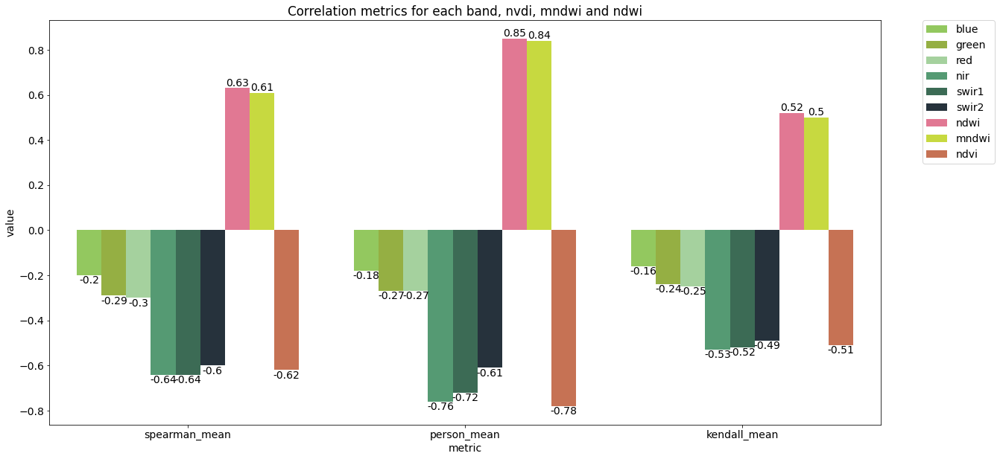

In [ ]:
#dataframe using two decimals
spearman_mean_round = [round(num, 2) for num in spearman_mean]
person_mean_round = [round(num, 2) for num in person_mean]
kendall_mean_round = [round(num, 2) for num in kendall_mean]

df = pd.DataFrame({'spearman_mean': spearman_mean_round, 'person_mean': person_mean_round, 'kendall_mean': kendall_mean_round}, index=['blue', 'green', 'red', 'nir', 'swir1', 'swir2', 'ndwi', 'mndwi', 'ndvi'])
df = df.transpose()
df = df.reset_index()
df = df.rename(columns={'index': 'metric'})
df = df.melt(id_vars=['metric'], value_vars = df.columns[1:], var_name='band', value_name='value')
fig, ax = plt.subplots(figsize=(20, 10))
sns.barplot(x='metric', y='value', hue='band', data=df, palette = colors, ax=ax)
ax.set_title('Correlation metrics for each band, nvdi, mndwi and ndwi')
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
for container in ax.containers:
    ax.bar_label(container)


#Conclusions
1. The dataset is really cool and useful.
2. The six band format provides a lot of information about the image.
3. The NDWI and MNDWI performs really well in this dataset.
4. The masks look good and accurate.
5. There are "few images" for a "deep learning" project, but we can handle this problem with data augmentation (crop, rotate, flip, etc.) or/and using a pretrained segmentation model (transfer learning).


##Defining a threshold to measure the acurrancy of NDWI and MNDWI
First we compute all the indexes for all the images and save them on a local folder to be easy to access.

In [ ]:
#compute the ndwi, mndwi and ndvi for each image and save it on a local folder
def compute_ndwi_mndwi_ndvi(df, folder_prefix = 'tra'):
    for i in tqdm(range(len(df))):
        path = df['path'][i]
        name = df['name'][i]
        stats = get_stats(path)
        # convert to numpy array
        ndwi = np.asarray(stats['ndwi'])
        mndwi = np.asarray(stats['mndwi'])
        ndvi = np.asarray(stats['ndvi'])
        
        #verify if the folder to save exists
        if not os.path.exists('/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/'+ folder_prefix +'_ndwi'):
            os.makedirs('/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/'+ folder_prefix +'_ndwi')
        if not os.path.exists('/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/'+ folder_prefix +'_mndwi'):
            os.makedirs('/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/'+ folder_prefix +'_mndwi')
        if not os.path.exists('/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/'+ folder_prefix +'_ndvi'):
            os.makedirs('/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/'+ folder_prefix +'_ndvi')

        #save the images as tiff 
        ndwi = Image.fromarray(ndwi)
        ndwi.save('/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/'+ folder_prefix +'_ndwi/'+ name +'.tif')
        mndwi = Image.fromarray(mndwi)
        mndwi.save('/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/'+ folder_prefix +'_mndwi/'+ name +'.tif')
        ndvi = Image.fromarray(ndvi)
        ndvi.save('/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/'+ folder_prefix +'_ndvi/'+ name +'.tif')
                        
        
    return
#for the train set
compute_ndwi_mndwi_ndvi(train_df, folder_prefix = 'tra')
#for the validation set
compute_ndwi_mndwi_ndvi(val_df, folder_prefix = 'val')

 16%|█▌        | 10/64 [00:03<00:19,  2.73it/s]<ipython-input-13-ae95594bf873>:17: RuntimeWarning: invalid value encountered in true_divide
  ndwi_im = (green - nir) / (green + nir)
<ipython-input-13-ae95594bf873>:20: RuntimeWarning: invalid value encountered in true_divide
  mndwi_im = (green - swir1) / (green + swir1)
<ipython-input-13-ae95594bf873>:23: RuntimeWarning: invalid value encountered in true_divide
  ndvi_im = (nir - red) / (nir + red)
100%|██████████| 64/64 [00:19<00:00,  3.24it/s]


Let's add the ndwi, mndwi and ndvi images paths to the dataframes.

In [ ]:
#update the train dataframe with the new paths to the ndwi, mndwi and ndvi images
train_df['ndwi_path'] = train_df['name'].apply(lambda x: '/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/tra_ndwi/'+ x +'.tif')   
train_df['mndwi_path'] = train_df['name'].apply(lambda x: '/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/tra_mndwi/'+ x +'.tif')
train_df['ndvi_path'] = train_df['name'].apply(lambda x: '/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/tra_ndvi/'+ x +'.tif')
#update the validation dataframe with the new paths to the ndwi, mndwi and ndvi images
val_df['ndwi_path'] = val_df['name'].apply(lambda x: '/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/val_ndwi/'+ x +'.tif')
val_df['mndwi_path'] = val_df['name'].apply(lambda x: '/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/val_mndwi/'+ x +'.tif')
val_df['ndvi_path'] = val_df['name'].apply(lambda x: '/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/val_ndvi/'+ x +'.tif')

Define functions to transform the index in masks and compute the IoU with the real mask.

In [ ]:
#convert 0 and 1 by threshold
def convert_0_1(np_array, threshold):
    return np.where(np_array > threshold, 1, 0)

#compute the IoU for a index and a mask
def compute_iou(index, mask):
    intersection = np.logical_and(index, mask)
    union = np.logical_or(index, mask)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score

#compute the IoU for a index and a mask using a threshold
def compute_iou_threshold(index, mask, threshold):
    np_array = convert_0_1(index, threshold)
    iou_score = compute_iou(np_array, mask)
    return iou_score

def compute_iou_thresholds_from_df_rows(row, index_name, threshold):
    index = np.asarray(Image.open(row[index_name]))
    mask = np.asarray(Image.open(row['mask_path']))
    iou_score = compute_iou_threshold(index, mask, threshold)
    return iou_score

compute_iou_thresholds_from_df_rows(train_df.iloc[16], 'ndwi_path', -0.3)

0.6044918740339459

Compute it on all the train dataset

In [ ]:
#for all the dataset
def compute_mean_iou_from_thresholds_from_df(df, index_name, thresholds):
    #df = dataframe with paths
    #index_name = name of the index we're working with ej: 'ndwi_path'
    #thresholds = list of thresholds to compute the mean IoU
    mean_iou = []
    for threshold in tqdm(thresholds):
        iou = df.apply(lambda row: compute_iou_thresholds_from_df_rows(row, index_name, threshold), axis=1)
        mean_iou.append({'threshold': threshold, 'mean_iou': iou.mean()})
    return mean_iou

#compute the mean IoU for the train set
thresholds = np.linspace(-1, 1, 150)
ndwi_mean_iou = compute_mean_iou_from_thresholds_from_df(train_df, 'ndwi_path', thresholds)
mndwi_mean_iou = compute_mean_iou_from_thresholds_from_df(train_df, 'mndwi_path', thresholds)
#compute the mean IoU for the validation set
ndwi_mean_iou_val = compute_mean_iou_from_thresholds_from_df(val_df, 'ndwi_path', thresholds)
mndwi_mean_iou_val = compute_mean_iou_from_thresholds_from_df(val_df, 'mndwi_path', thresholds)

print(ndwi_mean_iou)
print(mndwi_mean_iou)

#create a dataframe with three columns: "threshold", "mean_iou" and "ndwi or mndwi"
IoU_df = pd.DataFrame(ndwi_mean_iou + mndwi_mean_iou)
IoU_df['index'] = ['ndwi']*len(thresholds) + ['mndwi']*len(thresholds)

#same for the validation set
IoU_df_val = pd.DataFrame(ndwi_mean_iou_val + mndwi_mean_iou_val)
IoU_df_val['index'] = ['ndwi']*len(thresholds) + ['mndwi']*len(thresholds)


#plot with sns
def plot_mean_iou(IoU_df, ax_title = None):
    sns.lineplot(data = IoU_df, x = 'threshold', y = 'mean_iou', hue = 'index', palette = 'flare')
    plt.title(ax_title)
    plt.show()

100%|██████████| 150/150 [02:37<00:00,  1.05s/it]

[{'threshold': -1.0, 'mean_iou': 0.22758464047050628}, {'threshold': -0.9865771812080537, 'mean_iou': 0.22758365379025774}, {'threshold': -0.9731543624161074, 'mean_iou': 0.22758032551672835}, {'threshold': -0.9597315436241611, 'mean_iou': 0.2275778188153026}, {'threshold': -0.9463087248322147, 'mean_iou': 0.22757624069968713}, {'threshold': -0.9328859060402684, 'mean_iou': 0.22757512949669645}, {'threshold': -0.9194630872483222, 'mean_iou': 0.22757451496326345}, {'threshold': -0.9060402684563759, 'mean_iou': 0.22757439086377773}, {'threshold': -0.8926174496644296, 'mean_iou': 0.22757467807720802}, {'threshold': -0.8791946308724832, 'mean_iou': 0.22758912345404378}, {'threshold': -0.8657718120805369, 'mean_iou': 0.22761777996726545}, {'threshold': -0.8523489932885906, 'mean_iou': 0.2276690768910049}, {'threshold': -0.8389261744966443, 'mean_iou': 0.22773726503848515}, {'threshold': -0.825503355704698, 'mean_iou': 0.22783572782857087}, {'threshold': -0.8120805369127517, 'mean_iou': 0.22

Let's visualize the best thresholds.

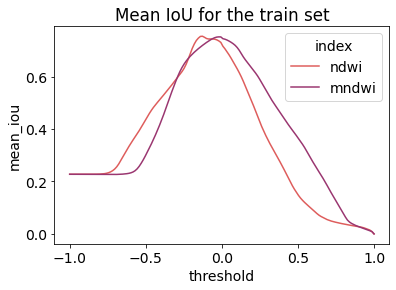

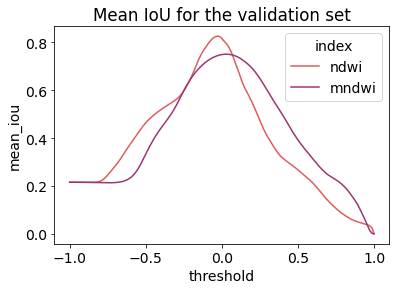

In [ ]:
#let's visualize the best thresholds
plot_mean_iou(IoU_df, ax_title = 'Mean IoU for the train set')
plot_mean_iou(IoU_df_val, ax_title = 'Mean IoU for the validation set')
#save the dataframes
IoU_df.to_csv('/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/IoU_df.csv')
IoU_df_val.to_csv('/content/drive/MyDrive/Islamabad Omdena/Data/Earth_surface_water/dset-s2/IoU_df_val.csv')


In [ ]:
#get the threshold with the best IoU
best_train_threshold_for_ndwi = IoU_df[IoU_df['index'] == 'ndwi'].sort_values(by = 'mean_iou', ascending = False).iloc[0]['threshold']
best_IoU_for_ndwi = IoU_df[IoU_df['index'] == 'ndwi'].sort_values(by = 'mean_iou', ascending = False).iloc[0]['mean_iou']
best_train_threshold_for_mndwi = IoU_df[IoU_df['index'] == 'mndwi'].sort_values(by = 'mean_iou', ascending = False).iloc[0]['threshold']
best_IoU_for_mndwi = IoU_df[IoU_df['index'] == 'mndwi'].sort_values(by = 'mean_iou', ascending = False).iloc[0]['mean_iou']
print('Best threshold for ndwi: ', best_train_threshold_for_ndwi, 'with IoU: ', best_IoU_for_ndwi)
print('Best threshold for mndwi: ', best_train_threshold_for_mndwi, 'with IoU: ', best_IoU_for_mndwi)

#same for the validation set
best_val_threshold_for_ndwi = IoU_df_val[IoU_df_val['index'] == 'ndwi'].sort_values(by = 'mean_iou', ascending = False).iloc[0]['threshold']
best_val_threshold_for_mndwi = IoU_df_val[IoU_df_val['index'] == 'mndwi'].sort_values(by = 'mean_iou', ascending = False).iloc[0]['threshold']
best_IoU_for_ndwi_val = IoU_df_val[IoU_df_val['index'] == 'ndwi'].sort_values(by = 'mean_iou', ascending = False).iloc[0]['mean_iou']
best_IoU_for_mndwi_val = IoU_df_val[IoU_df_val['index'] == 'mndwi'].sort_values(by = 'mean_iou', ascending = False).iloc[0]['mean_iou']
print('Best threshold for ndwi: ', best_val_threshold_for_ndwi, 'with IoU: ', best_IoU_for_ndwi_val)
print('Best threshold for mndwi: ', best_val_threshold_for_mndwi, 'with IoU: ', best_IoU_for_mndwi_val)


Best threshold for ndwi:  -0.12751677852348997 with IoU:  0.754208127007711
Best threshold for mndwi:  -0.020134228187919434 with IoU:  0.7517926164051709
Best threshold for ndwi:  -0.033557046979865834 with IoU:  0.8258122855708949
Best threshold for mndwi:  0.033557046979865834 with IoU:  0.7509397302689294


##Training data results

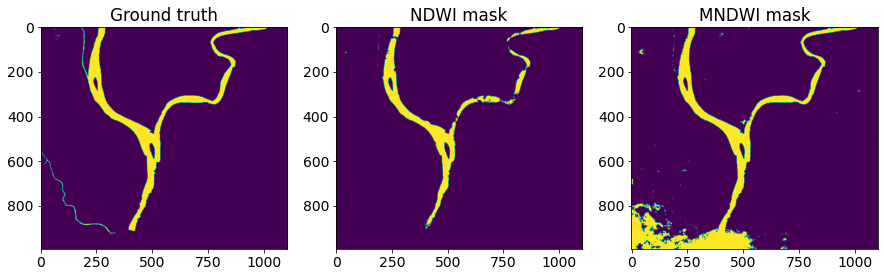

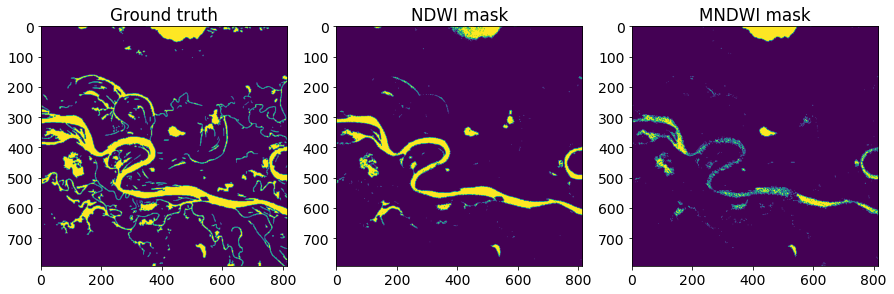

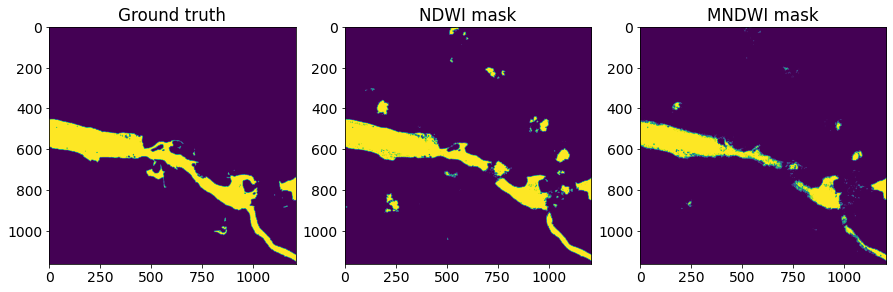

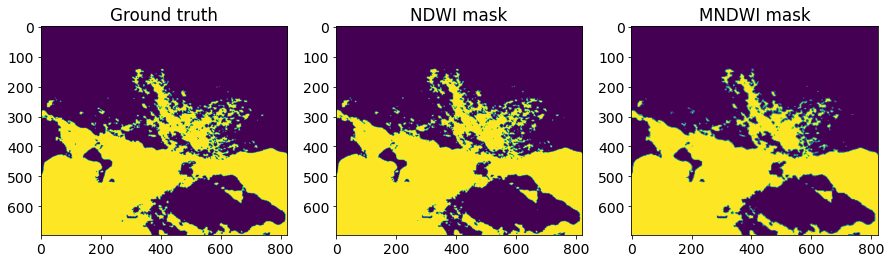

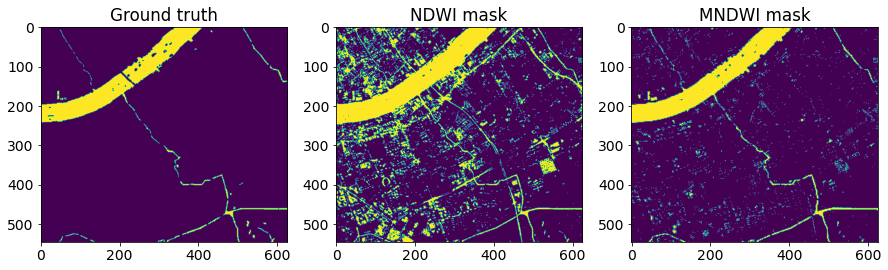

In [ ]:
#function to plot random images with the predicted mask and the ground truth
def plot_random_images_with_mask(df, threshold_ndwi = best_train_threshold_for_ndwi, threshold_mndwi = best_train_threshold_for_mndwi, n_images = 5, ndwi = True, mndwi = True):
    #get random images
    random_images = df.sample(n_images)
    #get the mask for each image
    for index, row in random_images.iterrows():
        #read the mask with Image as a numpy array
        mask = Image.open(row['mask_path'])
        mask = np.array(mask)
        #read the ndwi and mndwi images and get the masks
        if ndwi:
            ndwi_image = Image.open(row['ndwi_path'])
            ndwi_image = np.array(ndwi_image)
            ndwi_mask = convert_0_1(ndwi_image, threshold_ndwi)
        if mndwi:
            mndwi_image = Image.open(row['mndwi_path'])
            mndwi_image = np.array(mndwi_image)
            mndwi_mask = convert_0_1(mndwi_image, threshold_mndwi)
        #plot the images
        fig, ax = plt.subplots(1, 1 + ndwi + mndwi, figsize = (15, 15))
        ax[0].imshow(mask)
        ax[0].set_title('Ground truth')
        if ndwi:
            ax[1].imshow(ndwi_mask)
            ax[1].set_title('NDWI mask')
        if mndwi:
            ax[2].imshow(mndwi_mask)
            ax[2].set_title('MNDWI mask')
#plot random images with the predicted mask and the ground truth for the train set
plot_random_images_with_mask(train_df, threshold_ndwi = best_train_threshold_for_ndwi, threshold_mndwi = best_train_threshold_for_mndwi, n_images = 5, ndwi = True, mndwi = True)

##Validation data results

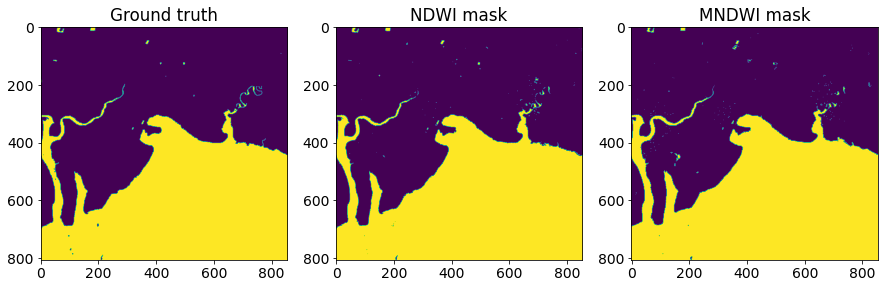

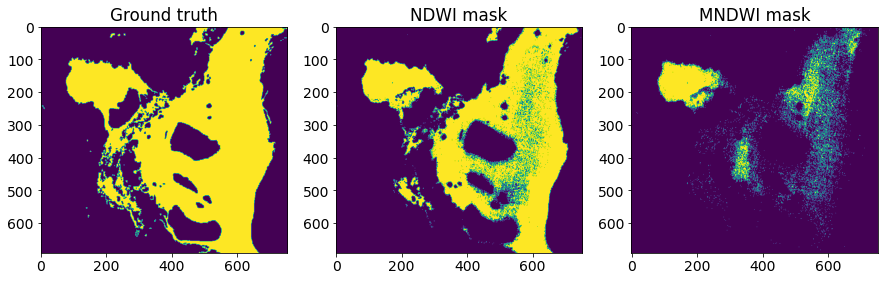

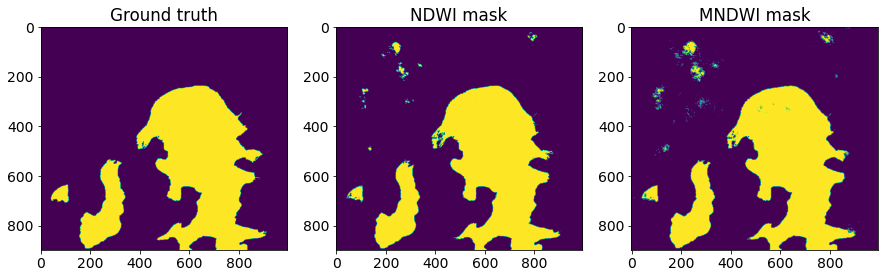

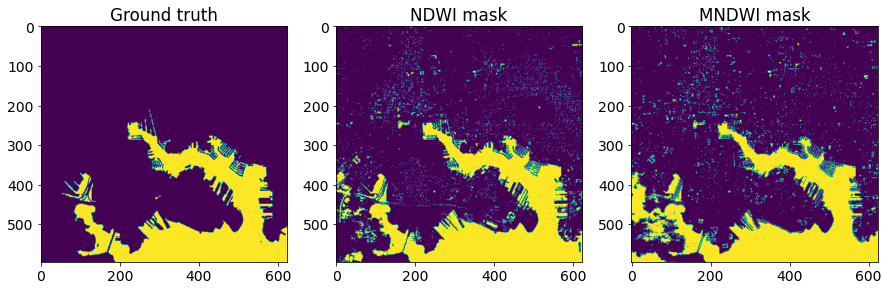

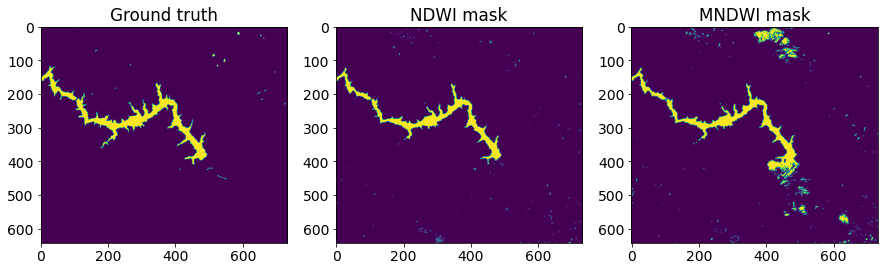

In [ ]:
plot_random_images_with_mask(val_df, threshold_ndwi = best_val_threshold_for_ndwi, threshold_mndwi = best_val_threshold_for_mndwi, n_images = 5, ndwi = True, mndwi = True)